In [101]:
import pandas as pd
import io
import matplotlib.pyplot as plt
df_post = pd.read_csv('/content/posts.csv')
print("Completed loading post.csv")

df_votes= pd.read_csv('/content/votes.csv')
print("Completed loading votes.csv")

Completed loading post.csv
Completed loading votes.csv


In [102]:
print("post data types\n {}".format(df_post.dtypes))
print("vote data types\n {}".format(df_votes.dtypes))
print(df_post.shape)
print(df_post.dtypes)

post data types
 Unnamed: 0                int64
id                        int64
post_type_id              int64
accepted_answer_id        int64
parent_id               float64
creation_date            object
score                   float64
view_count              float64
owner_user_id           float64
tags                     object
answer_count            float64
comment_count           float64
favorite_count          float64
closed_date              object
community_owned_date     object
dtype: object
vote data types
 Unnamed: 0         int64
id                 int64
post_id            int64
vote_type_id       int64
creation_date     object
bounty_amount      int64
user_id          float64
dtype: object
(1251257, 15)
Unnamed: 0                int64
id                        int64
post_type_id              int64
accepted_answer_id        int64
parent_id               float64
creation_date            object
score                   float64
view_count              float64
owner_user_id

In [103]:
df_post['creation_date'] = pd.to_datetime(df_post['creation_date'],errors='coerce',format='%Y-%m-%d')
df_post['closed_date'] = pd.to_datetime(df_post['closed_date'],errors='coerce',format='%Y-%m-%dT%H:%M:%S.%f')
df_post['community_owned_date'] = pd.to_datetime(df_post['community_owned_date'],errors='coerce',format='%Y-%m-%dT%H:%M:%S.%f')
df_votes['creation_date'] = pd.to_datetime(df_votes['creation_date'],errors='coerce',format='%Y-%m-%d')
df_post['creation_date'] = pd.to_datetime(df_post['creation_date'],errors='coerce',format='%Y-%m-%d')


In [104]:
df_posts =df_post[df_post['post_type_id']==2]
df_posts_ans =df_post[df_post['post_type_id']==2]

In [105]:
df_votes_up =df_votes[df_votes['vote_type_id']==2]
df_votes_ans =df_votes[df_votes['vote_type_id']==1]

In [107]:
df_votes_up['creation_date']

0         2008-07-31
1         2008-07-31
2         2008-07-31
3         2008-07-31
4         2008-07-31
             ...    
2191956   2009-05-22
2191957   2009-05-22
2191958   2009-05-22
2191959   2009-05-22
2191960   2009-05-22
Name: creation_date, Length: 1784102, dtype: datetime64[ns]

In [108]:
df_votes_ans['creation_date']

99        2008-08-01
112       2008-08-01
113       2008-08-01
135       2008-08-01
140       2008-08-01
             ...    
2191850   2009-05-22
2191855   2009-05-22
2191888   2009-05-22
2191932   2009-05-22
2191943   2009-05-22
Name: creation_date, Length: 95934, dtype: datetime64[ns]

In [109]:
df_post['creation_date']
df_post['Date_New'] = df_post['creation_date'].dt.date


In [110]:
df_post['creation_date'] = pd.to_datetime(df_post['Date_New'],errors='coerce',format='%Y-%m-%d')
df_post['creation_date']

0         2008-07-31
1         2008-07-31
2         2008-07-31
3         2008-07-31
4         2008-07-31
             ...    
1251252   2009-09-18
1251253   2009-09-18
1251254   2009-09-18
1251255   2009-09-18
1251256          NaT
Name: creation_date, Length: 1251257, dtype: datetime64[ns]

In [111]:
final_df = pd.merge(left=df_votes_up,right=df_post,how="left",left_on="post_id",right_on="post_type_id")
final_df =final_df[final_df['post_type_id']==2]

final_df_ans = pd.merge(left=df_votes_ans,right=df_post,how="left",left_on="vote_type_id",right_on="accepted_answer_id")


In [112]:
final_df.head()

,Unnamed: 0_x,id_x,post_id,vote_type_id,creation_date_x,bounty_amount,user_id,Unnamed: 0_y,id_y,post_type_id,accepted_answer_id,parent_id,creation_date_y,score,view_count,owner_user_id,tags,answer_count,comment_count,favorite_count,closed_date,community_owned_date,Date_New
287528,2,3,2,2,2008-07-31,-999,-999.0,2.0,7.0,2.0,-999.0,4.0,2008-07-31,84.0,0.0,9.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-07-31
287529,2,3,2,2,2008-07-31,-999,-999.0,6.0,12.0,2.0,-999.0,11.0,2008-07-31,70.0,0.0,1.0,NaN,0.0,7.0,0.0,NaT,2009-09-04 13:15:59.820,2008-07-31
287530,2,3,2,2,2008-07-31,-999,-999.0,11.0,18.0,2.0,-999.0,17.0,2008-08-01,9.0,0.0,-999.0,NaN,0.0,2.0,0.0,NaT,NaT,2008-08-01
287531,2,3,2,2,2008-07-31,-999,-999.0,13.0,20.0,2.0,-999.0,8.0,2008-08-01,3.0,0.0,5.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-08-01
287532,2,3,2,2,2008-07-31,-999,-999.0,14.0,21.0,2.0,-999.0,9.0,2008-08-01,2.0,0.0,13.0,NaN,0.0,0.0,0.0,NaT,2011-08-16 19:40:43.080,2008-08-01


In [114]:
answer_time = final_df['creation_date_y']- final_df['creation_date_x']
print(answer_time)
final_df['no_of_days'] = answer_time.astype(int)
parent_groups = final_df.groupby('parent_id')

287528      0 days
287529      0 days
287530      1 days
287531      1 days
287532      1 days
            ...   
1251253   414 days
1251254   414 days
1251255   414 days
1251256   414 days
1251257        NaT
Length: 963730, dtype: timedelta64[ns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  This is separate from the ipykernel package so we can avoid doing imports until


In [115]:
parent_groups.groups.items()

dict_items([(4.0, Int64Index([287528, 287562, 287567, 288895, 290893, 291430, 358937, 358957,
            493189, 687416],
           dtype='int64')), (6.0, Int64Index([287538, 288452, 313687, 863994], dtype='int64')), (8.0, Int64Index([287531, 287615, 289586], dtype='int64')), (9.0, Int64Index([287532, 287533, 287638, 288192, 288239, 289165, 294224, 295359,
            301486, 380914, 399839, 657240, 878078, 878257, 968681],
           dtype='int64')), (11.0, Int64Index([ 287529,  287535,  288119,  288364,  289048,  293261,  293416,
             293425,  294274,  294436,  294446,  294814,  295339,  298125,
             298127,  302379,  321314,  338284,  359721,  362839,  365029,
             411475,  441842,  624057,  670854,  710592, 1054729, 1208656],
           dtype='int64')), (13.0, Int64Index([287536, 287580, 287694, 287908, 287918, 288071, 308856, 462265,
            511098],
           dtype='int64')), (14.0, Int64Index([287539, 288530, 677763], dtype='int64')), (16.0, Int64I

In [116]:
parent_id=[]
date =[]
for key,value in parent_groups.groups.items():
  parent_id.append(key)
  date.append(final_df.loc[value[0]]["creation_date_y"])

In [117]:
import pandas as pd
filtered_ans = pd.DataFrame({'parent_id':parent_id, 'upvoted_answer':date})

In [118]:
final_df = pd.merge(final_df,filtered_ans,on=['parent_id'])

In [119]:
final_df.head()

,Unnamed: 0_x,id_x,post_id,vote_type_id,creation_date_x,bounty_amount,user_id,Unnamed: 0_y,id_y,post_type_id,accepted_answer_id,parent_id,creation_date_y,score,view_count,owner_user_id,tags,answer_count,comment_count,favorite_count,closed_date,community_owned_date,Date_New,no_of_days,upvoted_answer
0,2,3,2,2,2008-07-31,-999,-999.0,2.0,7.0,2.0,-999.0,4.0,2008-07-31,84.0,0.0,9.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-07-31,0,2008-07-31
1,2,3,2,2,2008-07-31,-999,-999.0,56.0,78.0,2.0,-999.0,4.0,2008-08-01,4.0,0.0,55.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-08-01,86400000000000,2008-07-31
2,2,3,2,2,2008-07-31,-999,-999.0,64.0,86.0,2.0,-999.0,4.0,2008-08-01,23.0,0.0,39.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-08-01,86400000000000,2008-07-31
3,2,3,2,2,2008-07-31,-999,-999.0,1723.0,2791.0,2.0,-999.0,4.0,2008-08-05,6.0,0.0,446.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-08-05,432000000000000,2008-07-31
4,2,3,2,2,2008-07-31,-999,-999.0,4148.0,6383.0,2.0,-999.0,4.0,2008-08-08,5.0,0.0,56.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-08-08,691200000000000,2008-07-31


In [121]:
final_df['newDate'] = final_df['creation_date_y'] - final_df['upvoted_answer']

In [122]:
final_df.head()

,Unnamed: 0_x,id_x,post_id,vote_type_id,creation_date_x,bounty_amount,user_id,Unnamed: 0_y,id_y,post_type_id,accepted_answer_id,parent_id,creation_date_y,score,view_count,owner_user_id,tags,answer_count,comment_count,favorite_count,closed_date,community_owned_date,Date_New,no_of_days,upvoted_answer,newDate
0,2,3,2,2,2008-07-31,-999,-999.0,2.0,7.0,2.0,-999.0,4.0,2008-07-31,84.0,0.0,9.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-07-31,0,2008-07-31,0 days
1,2,3,2,2,2008-07-31,-999,-999.0,56.0,78.0,2.0,-999.0,4.0,2008-08-01,4.0,0.0,55.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-08-01,86400000000000,2008-07-31,1 days
2,2,3,2,2,2008-07-31,-999,-999.0,64.0,86.0,2.0,-999.0,4.0,2008-08-01,23.0,0.0,39.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-08-01,86400000000000,2008-07-31,1 days
3,2,3,2,2,2008-07-31,-999,-999.0,1723.0,2791.0,2.0,-999.0,4.0,2008-08-05,6.0,0.0,446.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-08-05,432000000000000,2008-07-31,5 days
4,2,3,2,2,2008-07-31,-999,-999.0,4148.0,6383.0,2.0,-999.0,4.0,2008-08-08,5.0,0.0,56.0,NaN,0.0,0.0,0.0,NaT,NaT,2008-08-08,691200000000000,2008-07-31,8 days


In [123]:
group_time = final_df.groupby("newDate")

In [143]:
x_axis =[]
y_axis =[]
for i,j in group_time.groups.items():
    if((i.days) >=0 and (i.days)<=25 ):
      x_axis.append(i.days)  
      y_axis.append(len(j))
print(x_axis)
print(y_axis)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
[782517, 54407, 12759, 7909, 5566, 4638, 4019, 3238, 2830, 2329, 1943, 1717, 1588, 1662, 1568, 1320, 1181, 1175, 1081, 999, 1044, 1103, 977, 919, 819, 794]


In [144]:
x_axis_ans =[]
y_axis_ans =[]
for i,j in group_time.groups.items():
    if((i.days) >=0 and (i.days)<=25 ):
      x_axis_ans.append(i.days)  
      y_axis_ans.append(len(j))

In [145]:
y_array =[]
y_array_ans =[]
cumm_Count = 0
cumm_Count_ans =0
for i in y_axis:
    y_avg =(i/10000)
    cumm_Count = y_avg+cumm_Count   
    y_array.append(cumm_Count)
#print(y_array) 
for i in y_axis_ans:
    y_avg_new =(i/10000)
    cumm_Count_ans = y_avg_new+cumm_Count_ans   
    y_array_ans.append(cumm_Count_ans)


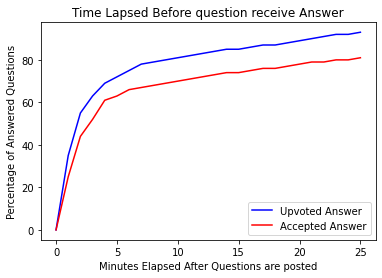

In [142]:
import matplotlib.pyplot as plt 

# plot lines
plt.plot(x_axis, y_array,color='b', label = "Upvoted Answer")
plt.plot(x_axis_ans, y_array_ans,color='r', label = "Accepted Answer")
plt.title('Time Lapsed Before question receive Answer')
plt.xlabel('Minutes Elapsed After Questions are posted')
plt.ylabel('Percentage of Answered Questions')
plt.legend()
plt.show()